# Demo Run

In [15]:
# %load_ext autoreload
# %autoreload 2
# # this may cause DisentenglementTargetManager to reimported, losing all the data e.g. configurations.

In [2]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
plt.rcParams["font.family"] = "DeJavu Serif"
plt.rcParams["font.serif"] = ["Times New Roman"]

In [3]:
import os
import sys
import gc
import warnings
import anndata as ad
import scanpy as sc
import torch
from pathlib import Path

sys.path.append(str(Path(os.getcwd()).resolve().parents[0]))

import tardis

local_run = False
if local_run:
    tardis.config = tardis.config_local
else:
    tardis.config = tardis.config_server
print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [4]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "dataset_subset_sex_2.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)

In [5]:
disentenglement_targets_configurations=[
    dict(
        obs_key = "sex",
        n_reserved_latent = 1,
        counteractive_minibatch_settings = dict(
            method = "random",
            method_kwargs = dict(
                within_labels = True,
                within_batch = False,
                within_categorical_covs = None,
                within_other_groups = True,
                seed = "forward",
            )
        ),
        auxillary_losses = dict(
            reserved_subset = dict(
                apply = True, 
                method = "mae_z", 
                weight = 3, 
                negative_sign = True, 
                progress_bar = True,
                method_kwargs = {}
            ),
            unreserved_subset = dict(
                apply = False, 
                method = "mse_z", 
                weight = 0.1, 
                negative_sign = True, 
                progress_bar = False,
                method_kwargs = {}
            ),
            complete_latent = dict(
                apply = False, 
                method = "mse_z", 
                weight = 0.010, 
                negative_sign = True,
                progress_bar = False, 
                method_kwargs = {}
            ),
        ),
    )
]

model_params = dict(
    n_hidden=512,
    n_layers=4, 
    n_latent=20, 
    gene_likelihood="nb",
    dropout_rate = 0.3,
    include_auxillary_loss = True
)
train_params = dict(
    max_epochs=400,
    train_size=0.9,
    batch_size=512,
    check_val_every_n_epoch=1,
    plan_kwargs = dict(
        n_epochs_kl_warmup=50,
        weight_decay=1e-4,
        # optimizer="AdamW"
    )
)
dataset_params = dict(
    layer=None, 
    labels_key="cell_type",
    batch_key="concatenated_integration_covariates",
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations
)

tardis.MyModel.setup_anndata(adata, **dataset_params)

# tardis.MyModel.setup_wandb(
#     wandb_configurations=tardis.config.wandb,
#     hyperparams=dict(
#         model_params=model_params,
#         train_params=train_params,
#         dataset_params=dataset_params,
#     )
# )

vae = tardis.MyModel(adata, **model_params)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8800, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)
/home/icb/kemal.inecik/work/codes/tardis/tardis/_mymodel.py:63: UserWarning: This dataset has some empty cells, this might fail inference.Data should be filtered with `scanpy.pp.filter_cells()`
  library_log_means, library_log_vars = _init_library_size(self.adata_manager, n_batch)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA A100 80GB PCIe') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torc

Epoch 1/400:   0%|                                                                                                                                                              | 0/400 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractiveminibatchgenerator.py:60: UserWarning: Possible group definition indices are calculating for `sex` for `training` set.
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractiveminibatchgenerator.py:60: UserWarning: Number of elements in each group for `sex` in `training` set: 756,384,583,841,1366,898,312,1029,813,336,251,1116,423,1530,2023,210,225,1169
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 2/400:   0%| | 1/400 [00:01<06:49,  1.03s/it, v_num=1, total_loss_validation=179, kl_local_validation=0.208, tardis|sex|reserved_subset_validation=-3.5, total_loss_train=160, kl_local_train=6.37

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractiveminibatchgenerator.py:60: UserWarning: Possible group definition indices are calculating for `sex` for `validation` set.
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractiveminibatchgenerator.py:60: UserWarning: Number of elements in each group for `sex` in `validation` set: 93,35,61,86,141,116,38,107,86,35,27,124,47,160,224,17,32,156
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 308/400:  77%|▊| 307/400 [02:52<00:51,  1.79it/s, v_num=1, total_loss_validation=144, kl_local_validation=15.6, tardis|sex|reserved_subset_validation=-11.7, total_loss_train=89.3, kl_local_train

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/pytorch/trainer/call.py:53: UserWarning: Detected KeyboardInterrupt, attempting graceful shutdown...
  rank_zero_warn("Detected KeyboardInterrupt, attempting graceful shutdown...")


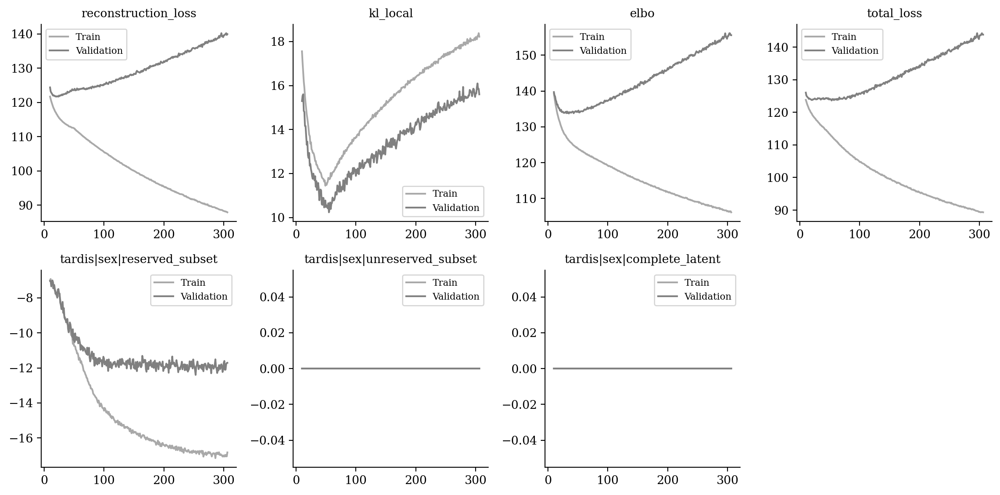

In [6]:
vae.plot_training_history(
    ignore_first=10, 
    n_col=4,
    metrics_name=[
        "reconstruction_loss", "kl_local", "elbo", "total_loss",
        "tardis|sex|reserved_subset", 
        "tardis|sex|unreserved_subset", 
        "tardis|sex|complete_latent"
    ]
)

In [7]:
from tardis._disentenglementtargetmanager import DisentenglementTargetManager
DisentenglementTargetManager.configurations.get_by_obs_key("sex").reserved_latent_indices

[0]

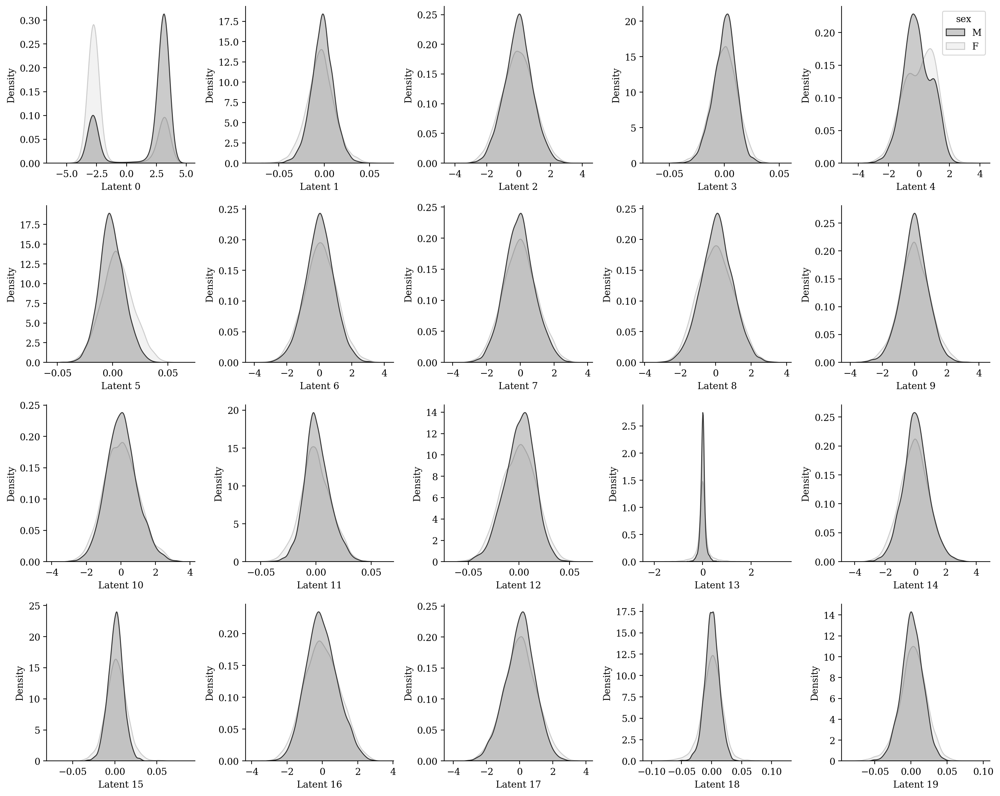

In [9]:
vae.plot_latent_kde(
    adata_obs=adata.obs,
    target_obs_key="sex",
    latent_representation=vae.get_latent_representation(),
    latent_dim_of_interest=None
)

# Playground

# Visualization

(15850, 20)

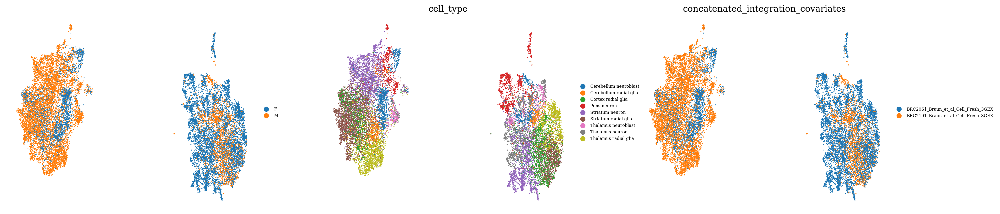

In [10]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent, n_neighbors = 30)
sc.tl.umap(latent, min_dist=0.2)
display(latent.shape)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=["sex", "cell_type", "concatenated_integration_covariates"], 
        ncols=3,
        frameon=False,
        title="",
        legend_fontsize="xx-small"
    )
    
del latent
gc.collect();

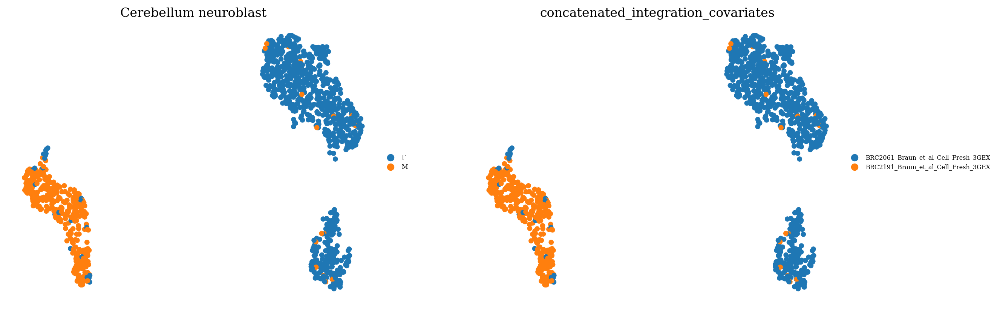

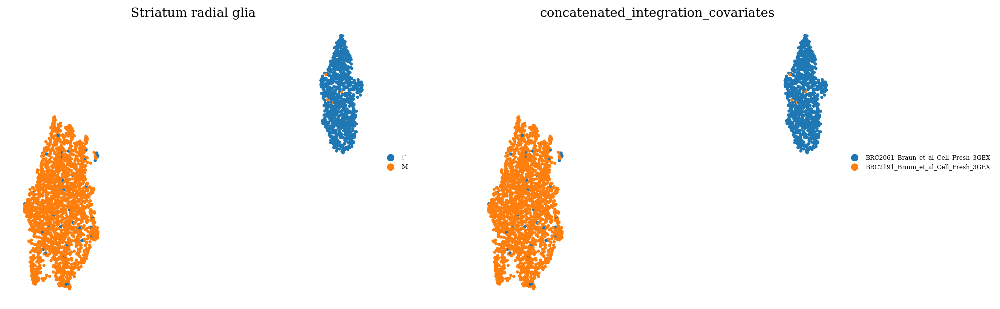

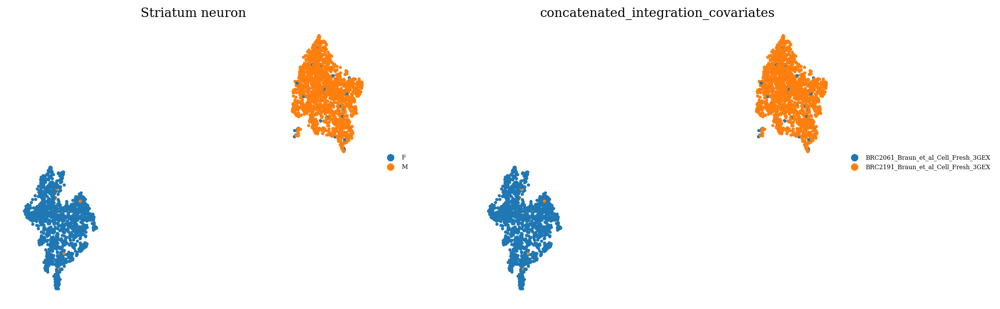

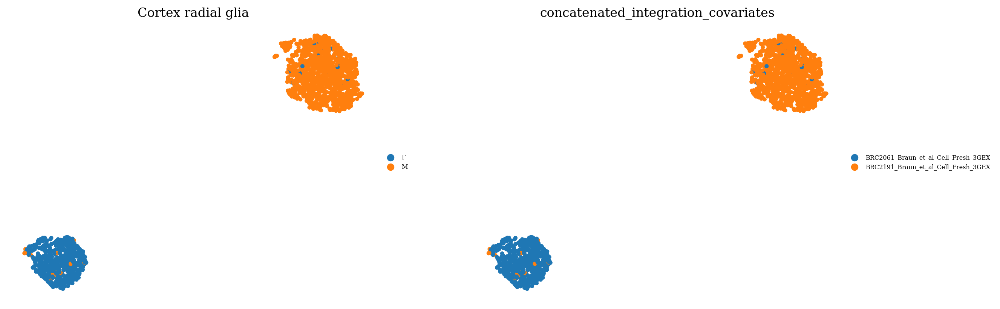

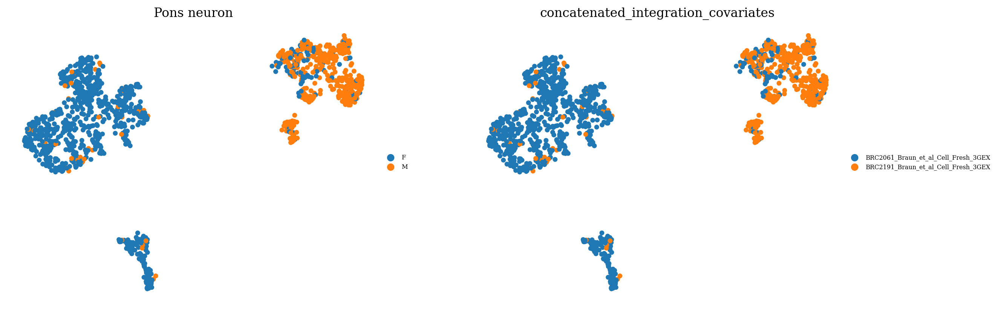

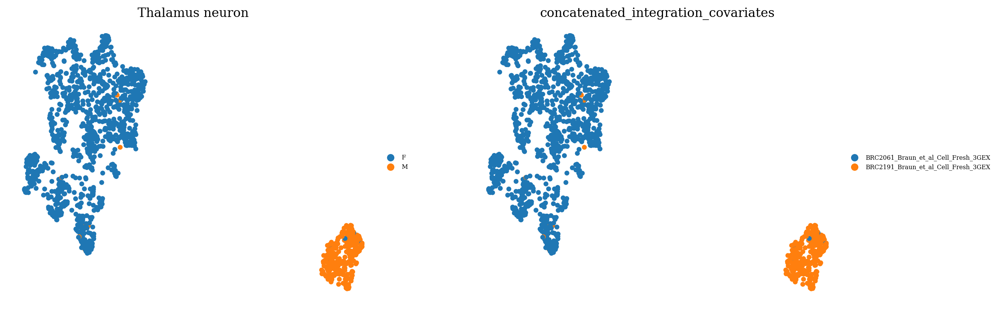

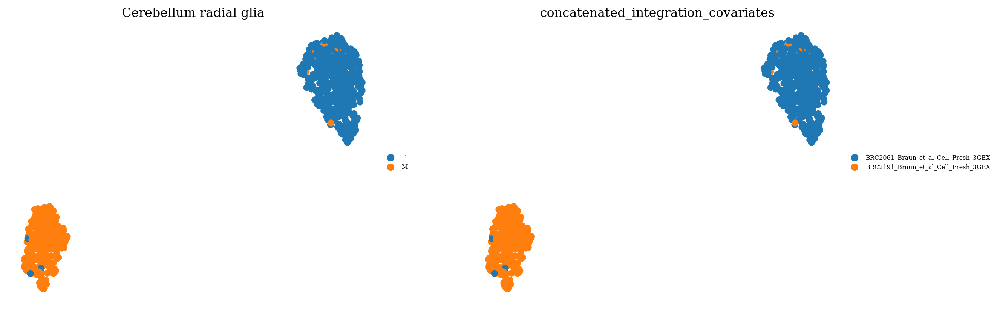

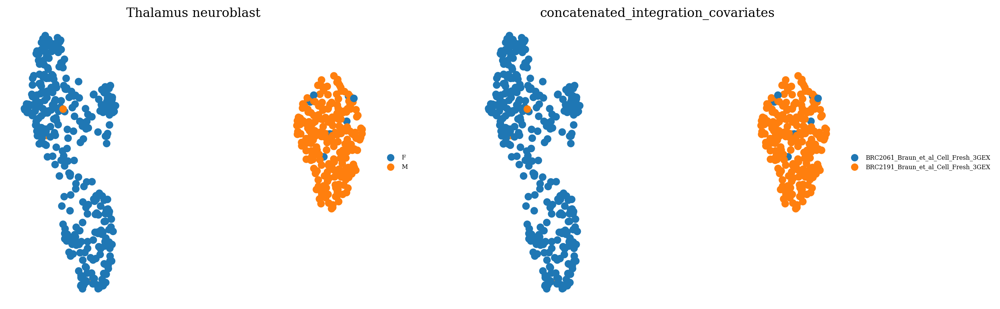

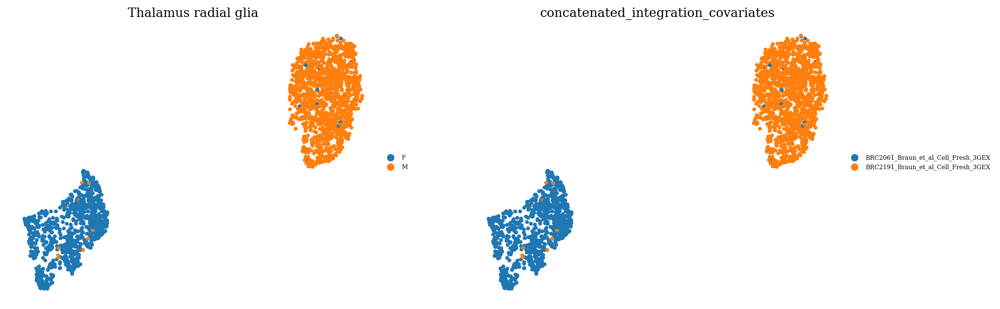

In [11]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
for cell_type in latent.obs["cell_type"].unique():
    _latent = latent[latent.obs["cell_type"] == cell_type].copy()
    sc.pp.neighbors(_latent, n_neighbors = 30)
    sc.tl.umap(_latent, min_dist=0.2)
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        sc.pl.umap(
            _latent, 
            color=["sex", "concatenated_integration_covariates"], 
            ncols=2,
            frameon=False,
            title=cell_type,
            legend_fontsize="xx-small"
        )
    del _latent
    gc.collect();

del latent
gc.collect();

(15850, 19)

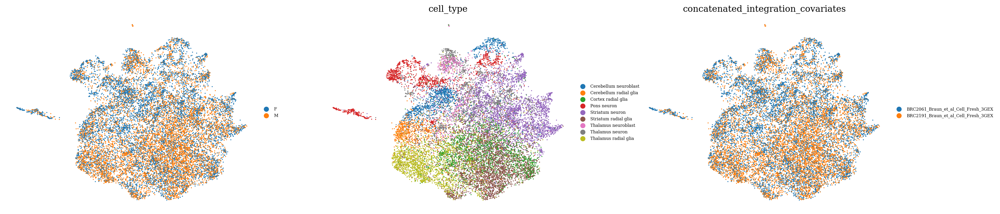

In [12]:
from tardis._disentenglementtargetmanager import DisentenglementTargetManager
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentenglementTargetManager.configurations.get_by_obs_key("sex").unreserved_latent_indices], obs=adata.obs.copy())
sc.pp.neighbors(latent, n_neighbors = 30)
sc.tl.umap(latent, min_dist=0.2)
display(latent.shape)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=["sex", "cell_type", "concatenated_integration_covariates"], 
        ncols=3,
        frameon=False,
        title="",
        legend_fontsize="xx-small"
    )

del latent
gc.collect();

(15850, 1)

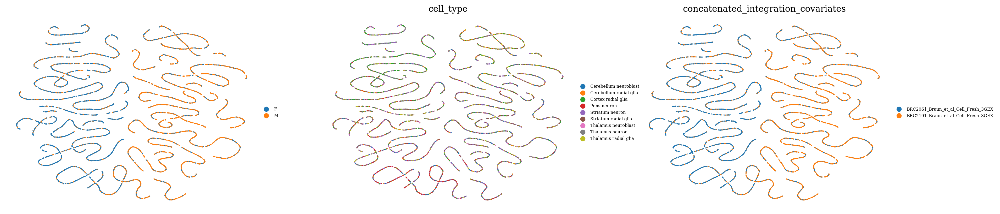

In [13]:
from tardis._disentenglementtargetmanager import DisentenglementTargetManager
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentenglementTargetManager.configurations.get_by_obs_key("sex").reserved_latent_indices], obs=adata.obs.copy())
sc.pp.neighbors(latent, n_neighbors = 30)
sc.tl.umap(latent, min_dist=0.2)
display(latent.shape)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=["sex", "cell_type", "concatenated_integration_covariates"], 
        ncols=3,
        frameon=False,
        title="",
        legend_fontsize="xx-small"
    )

del latent
gc.collect();

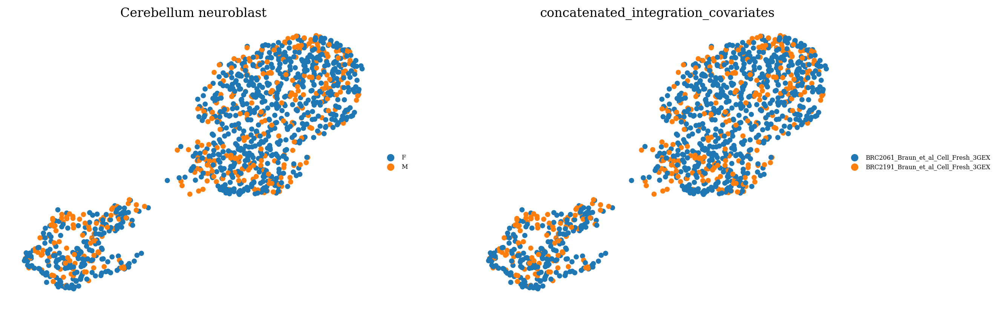

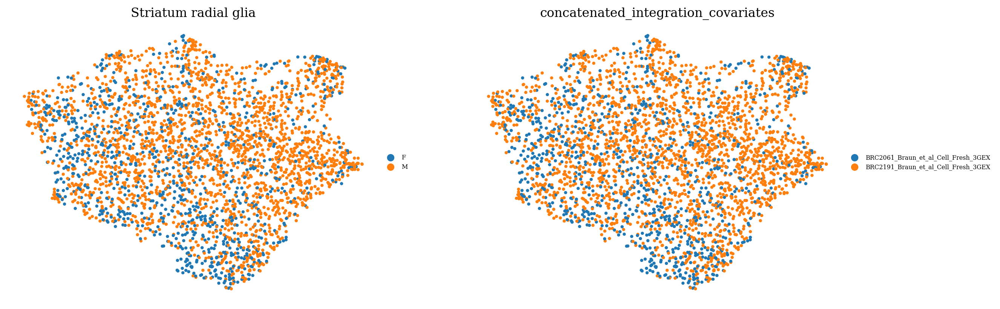

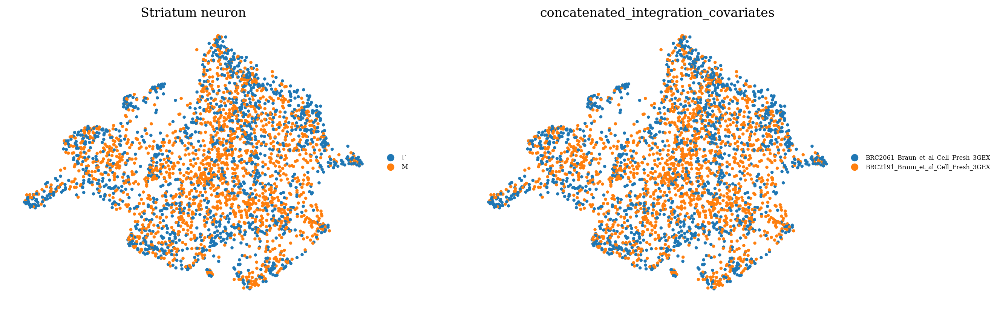

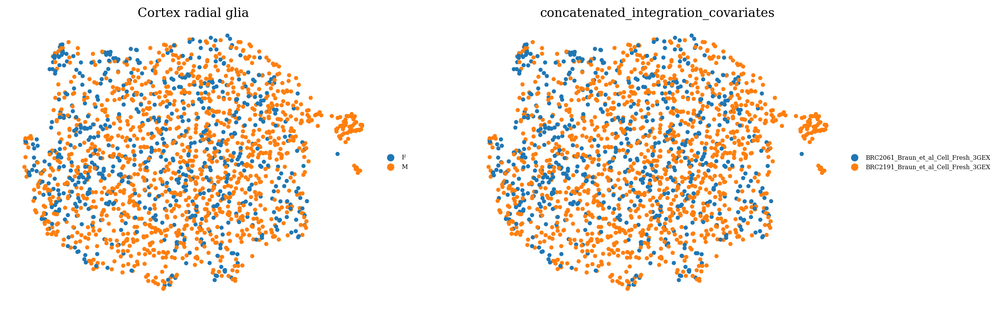

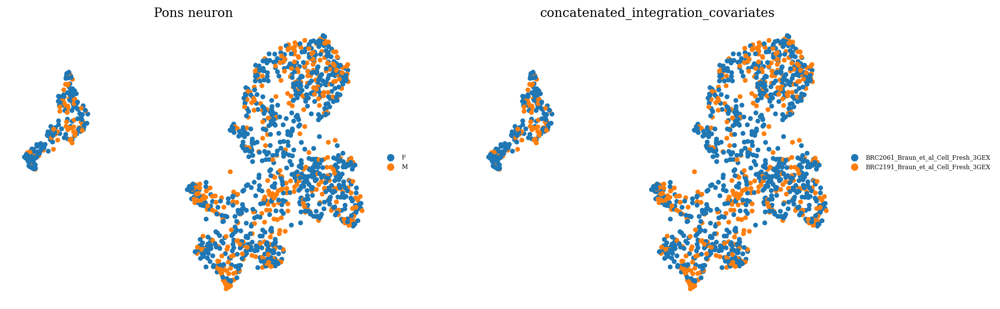

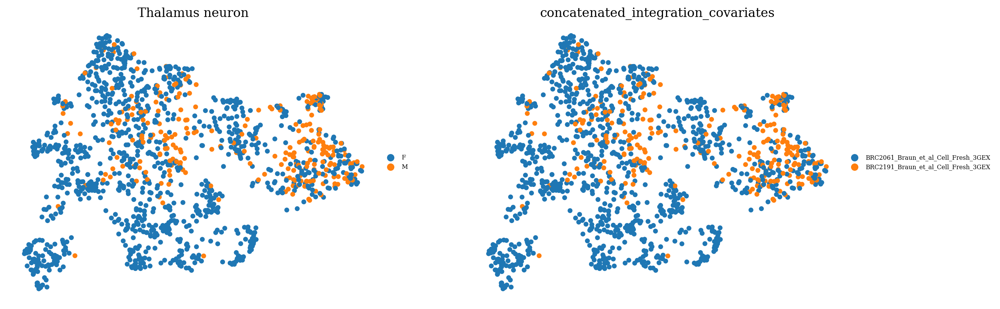

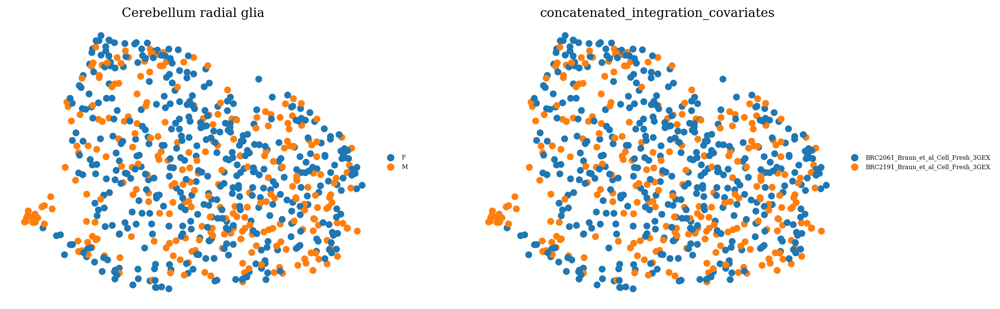

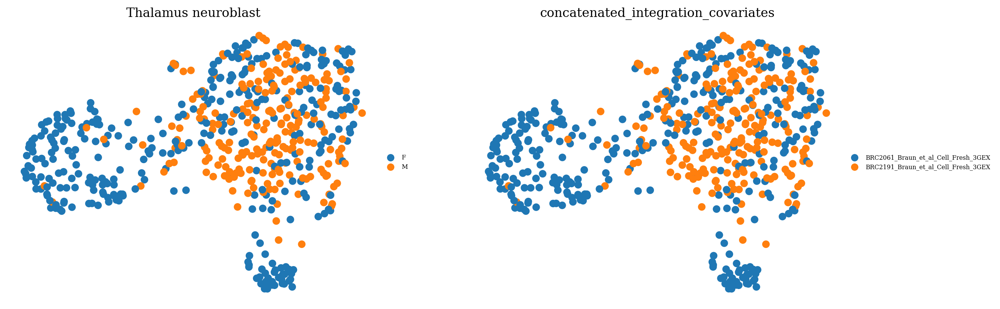

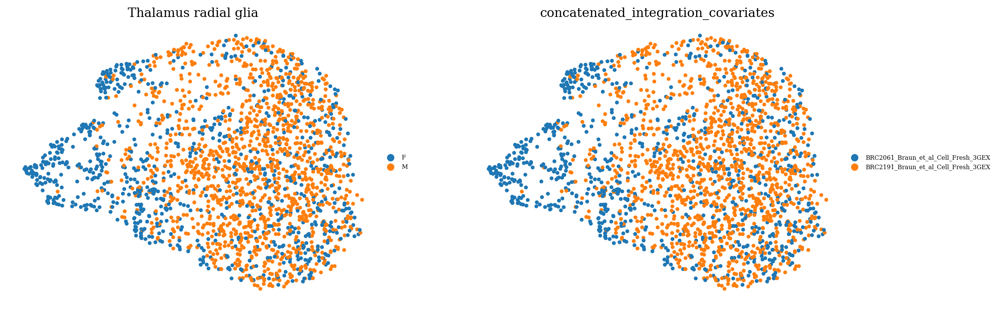

In [14]:
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentenglementTargetManager.configurations.get_by_obs_key("sex").unreserved_latent_indices], obs=adata.obs.copy())
for cell_type in latent.obs["cell_type"].unique():
    _latent = latent[latent.obs["cell_type"] == cell_type].copy()
    sc.pp.neighbors(_latent, n_neighbors = 30)
    sc.tl.umap(_latent, min_dist=0.2)
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        sc.pl.umap(
            _latent, 
            color=["sex", "concatenated_integration_covariates"], 
            ncols=2,
            frameon=False,
            title=cell_type,
            legend_fontsize="xx-small"
        )
    del _latent
    gc.collect();
    
del latent
gc.collect();